In [8]:
!pip install torch torchvision timm

In [9]:
!pip install torchinfo

In [49]:
# Import needed libraries
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

import kagglehub
import zipfile
import os
import shutil
import pickle

from torch import cuda
import os
from collections import Counter


import PIL
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader, random_split
from torchinfo import summary
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
from tqdm.notebook import tqdm
import timm
import sklearn.model_selection
from torch.cuda.amp import GradScaler, autocast
from sklearn.model_selection import KFold

from google.colab import files
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns

In [11]:
# Detect and set hardware
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"

print(f"Using {device}")

Using cuda


# **Disease Detection**


In [12]:
# List files in the path
path = "/kaggle/input/five-crop-diseases-dataset"
print(os.listdir(path))

['Crop Diseases Dataset']


In [61]:
# Get folders in dataset folder
data_dir = os.path.join(path, "Crop Diseases Dataset")

print("Folder in dataset folder:", os.listdir(data_dir))

Folder in dataset folder: ['Crop Diseases', 'Info.txt']


In [59]:
# Create a directory for Info.txt
info_file_path = os.path.join(data_dir, "Info.txt")

# Read and print the contents of Info.txt
with open(info_file_path, 'r') as file:
    contents = file.read()
    print("Contents of Info.txt:")
    print(contents)

Contents of Info.txt:
Total number of classes = 17
Total number of images = 13,324 

Class Labels: Corn___Common_Rust, Corn___Gray_Leaf_Spot, Corn___Healthy, Corn___Northern_Leaf_Blight, Potato___Early_Blight, Potato___Healthy, Potato___Late_Blight, Rice___Brown_Spot, Rice___Healthy, Rice___Leaf_Blast, Rice___Neck_Blast, Wheat___Brown_Rust, Wheat___Healthy, Wheat___Yellow_Rust , Sugarcane__Red_Rot , Sugarcane__Healthy , Sugarcane__Bacterial Blight.

Corn Plant Species:

1. Common Rust (1192 images)
2. Gray Leaf Spot (513 images)
3. Healthy (1162 images)
4. Northern Leaf Blight (985 images)

Total images: 3852 images    
52,229,657 bytes
All the images of the Corn species has been collected from the PlantVillage dataset [1]. PlantVillage is a standard and most popular leaf image dataset for plant disease detection.

Potato Plant Species:

1. Early Blight (1000 images)
2. Healthy (152 images)
3. Late Blight (1000 images)

Total images: 2152 images    
39,441,201 bytes
All the images of t

In [15]:
disease_path = os.path.join(data_dir, "Crop Diseases")
print("Folder in dataset files:", os.listdir(disease_path))

Folder in dataset files: ['Crop___Disease']


In [16]:
diseases_path = os.path.join(disease_path, "Crop___Disease")
print("Files and folders in Crop___Disease:", os.listdir(diseases_path))

Files and folders in Crop___Disease: ['Wheat', 'sugarcane', 'Corn', 'Rice', 'Potato']


Move files to "merged_disease_path" for easy accessibility

In [17]:
base_input_path = "/kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases"
crop_folders = ['Wheat', 'sugarcane', 'Corn', 'Rice', 'Potato']

# Create the merged_diseases directory in /kaggle/working
merged_disease_path = "/kaggle/working/merged_diseases"

# Create the new merged_diseases directory if it doesn't exist
if not os.path.exists(merged_disease_path):
    os.makedirs(merged_disease_path)
    print(f"Created directory: {merged_disease_path}")
else:
    print(f"Directory already exists: {merged_disease_path}")

for crop in crop_folders:
    crop_path = os.path.join(base_input_path, "Crop___Disease", crop)
    print(f"Processing crop: {crop}")
    if os.path.exists(crop_path) and os.path.isdir(crop_path):
        subfolders = [f.path for f in os.scandir(crop_path) if f.is_dir()]
        for subfolder in subfolders:
            subfolder_name = os.path.basename(subfolder)

            # Format the destination folder name consistently
            if crop.lower() == 'sugarcane':
                # For sugarcane, we need to add the prefix and format the name
                formatted_name = subfolder_name.replace(' ', '_')  # Replace spaces with underscores
                destination_folder = f"Sugarcane__{formatted_name}"
            else:
                # For other crops, use the existing name (assuming it's already formatted)
                destination_folder = subfolder_name

            destination_path = os.path.join(merged_disease_path, destination_folder)

            if not os.path.exists(destination_path):
                os.makedirs(destination_path)
                print(f"  Created destination subfolder: {destination_path}")

            # Now, let's copy the files from the original subfolder to the new destination
            files_to_copy = [f.path for f in os.scandir(subfolder) if f.is_file()]
            for file_path in files_to_copy:
                try:
                    shutil.copy(file_path, destination_path)
                except Exception as e:
                    print(f"    Error copying {file_path}: {e}")
            print(f"  Copied {len(files_to_copy)} files from {subfolder} to {destination_path}")
    else:
        print(f"  Warning: Crop folder not found or is not a directory: {crop_path}")

print("Finished merging subfolders.")

Created directory: /kaggle/working/merged_diseases
Processing crop: Wheat
  Created destination subfolder: /kaggle/working/merged_diseases/Wheat___Yellow_Rust
  Copied 924 files from /kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Wheat/Wheat___Yellow_Rust to /kaggle/working/merged_diseases/Wheat___Yellow_Rust
  Created destination subfolder: /kaggle/working/merged_diseases/Wheat___Brown_Rust
  Copied 902 files from /kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Wheat/Wheat___Brown_Rust to /kaggle/working/merged_diseases/Wheat___Brown_Rust
  Created destination subfolder: /kaggle/working/merged_diseases/Wheat___Healthy
  Copied 1116 files from /kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Wheat/Wheat___Healthy to /kaggle/working/merged_diseases/Wheat___Healthy
Processing crop: sugarcane
  Created destination subfolder: /kaggle/working/merged_diseases/Su

In [62]:
# List folders in merged_disease_path
os.listdir(merged_disease_path)

['Potato___Early_Blight',
 'Sugarcane__Red_Rot',
 'Wheat___Yellow_Rust',
 'Sugarcane__Healthy',
 'Rice___Neck_Blast',
 'Corn___Northern_Leaf_Blight',
 'Rice___Leaf_Blast',
 'Potato___Healthy',
 'Wheat___Brown_Rust',
 'Corn___Gray_Leaf_Spot',
 'Sugarcane__Bacterial_Blight',
 'Rice___Healthy',
 'Potato___Late_Blight',
 'Corn___Healthy',
 'Wheat___Healthy',
 'Corn___Common_Rust',
 'Rice___Brown_Spot']

In [63]:
# Count files in sub-folders of merged_disease_path
for sub_directory in os.listdir(merged_disease_path):
    sub_directory_path = os.path.join(merged_disease_path, sub_directory)

    # Get image files
    image_files = [
        f for f in os.listdir(sub_directory_path)
    ]

    print(f"{sub_directory} | Number of images: {len(image_files)}")

Potato___Early_Blight | Number of images: 1000
Sugarcane__Red_Rot | Number of images: 100
Wheat___Yellow_Rust | Number of images: 924
Sugarcane__Healthy | Number of images: 100
Rice___Neck_Blast | Number of images: 1000
Corn___Northern_Leaf_Blight | Number of images: 985
Rice___Leaf_Blast | Number of images: 977
Potato___Healthy | Number of images: 152
Wheat___Brown_Rust | Number of images: 902
Corn___Gray_Leaf_Spot | Number of images: 513
Sugarcane__Bacterial_Blight | Number of images: 100
Rice___Healthy | Number of images: 1488
Potato___Late_Blight | Number of images: 1000
Corn___Healthy | Number of images: 1162
Wheat___Healthy | Number of images: 1116
Corn___Common_Rust | Number of images: 1192
Rice___Brown_Spot | Number of images: 613


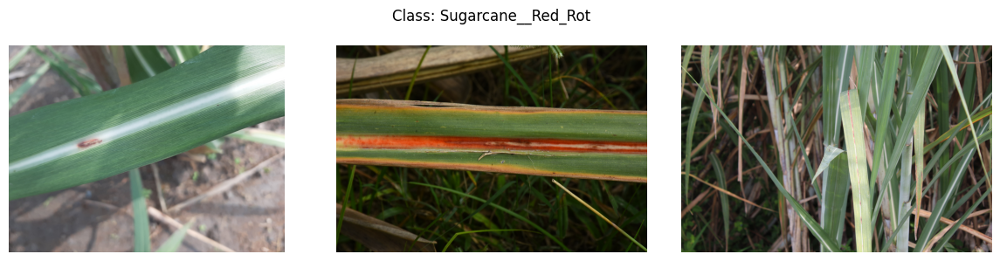

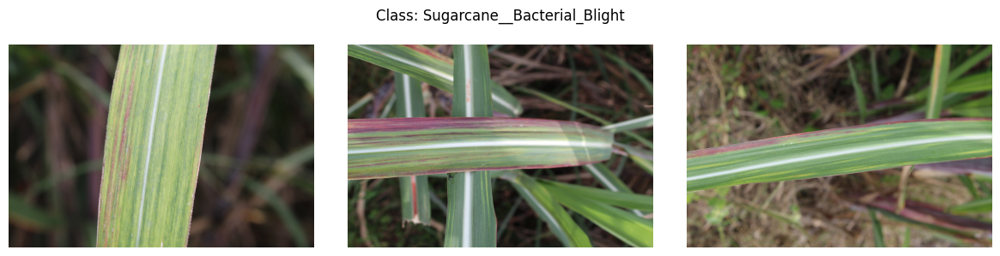

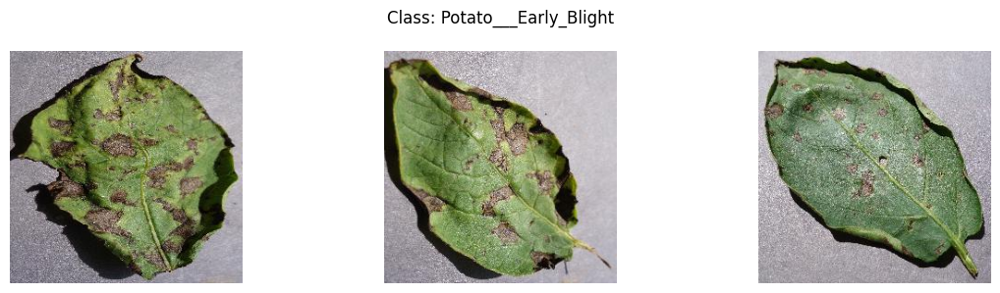

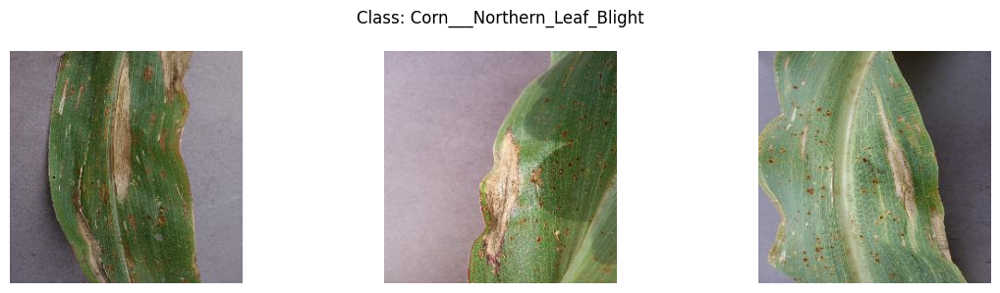

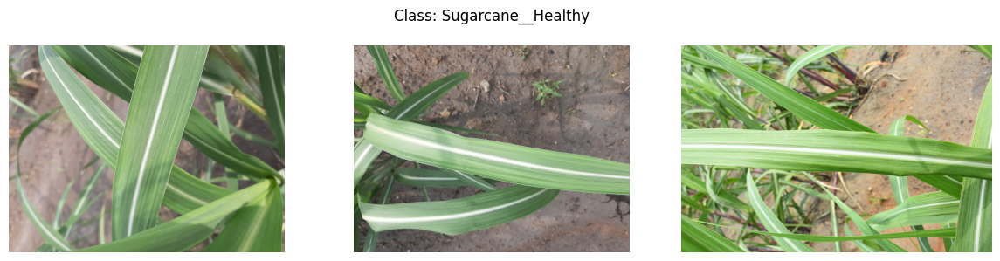

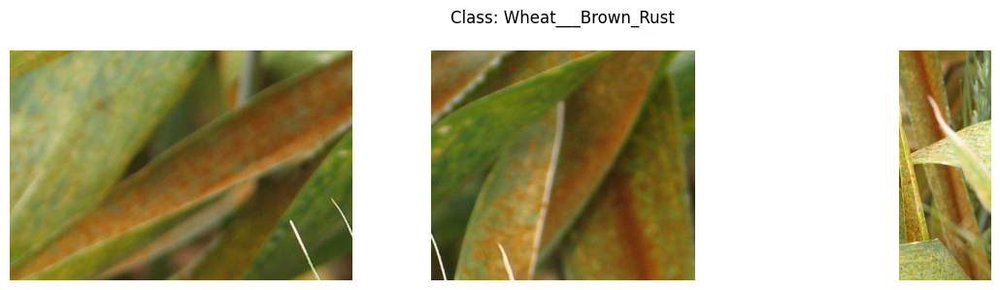

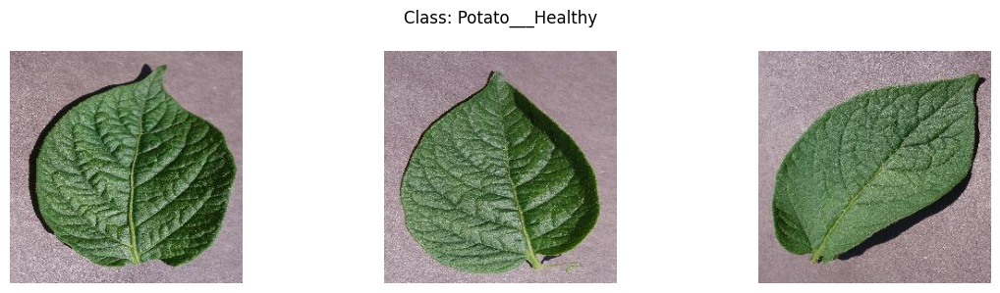

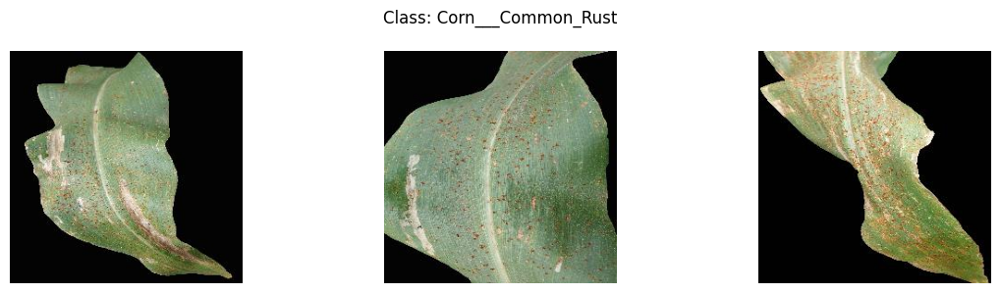

In [13]:
# Get the first 8 sub-directories (classes)
sub_dirs = os.listdir(merged_disease_path)[:8]  # First 8 classes

# Display 3 images per class
for class_name in sub_dirs:
    class_path = os.path.join(merged_disease_path, class_name)
    image_files = sorted(os.listdir(class_path))[:3]  # First 3 images

    plt.figure(figsize=(12, 3))
    plt.suptitle(f"Class: {class_name}", fontsize=12)

    for i, image_file in enumerate(image_files):
        img_path = os.path.join(class_path, image_file)
        img = Image.open(img_path)

        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [64]:
# Create and use a transformation pipeline
tranform = transforms.Compose(
    [
        transforms.Resize((300, 300)), # EfficientNet-B3 default input size
        transforms.ToTensor()
    ]
)

# Use transformation
image_dataset = ImageFolder(root = merged_disease_path, transform = tranform)
dataloader = DataLoader(image_dataset, batch_size = 64)

In [16]:
# List all class folders
print(f"Classes in dataset: {image_dataset.classes}")
print(f"We have {len(image_dataset.classes)} classes in our dataset")
print()
print("Tensor shape for one image:")
print(image_dataset[0][0].shape)

Classes in dataset: ['Corn___Common_Rust', 'Corn___Gray_Leaf_Spot', 'Corn___Healthy', 'Corn___Northern_Leaf_Blight', 'Potato___Early_Blight', 'Potato___Healthy', 'Potato___Late_Blight', 'Rice___Brown_Spot', 'Rice___Healthy', 'Rice___Leaf_Blast', 'Rice___Neck_Blast', 'Sugarcane__Bacterial_Blight', 'Sugarcane__Healthy', 'Sugarcane__Red_Rot', 'Wheat___Brown_Rust', 'Wheat___Healthy', 'Wheat___Yellow_Rust']
We have 17 classes in our dataset

Tensor shape for one image:
torch.Size([3, 300, 300])


In [22]:
# Get one batch
first_batch = next(iter(dataloader))

print(f"Shape of one batch: {first_batch[0].shape}")
print(f"Shape of labels: {first_batch[1].shape}")

Shape of one batch: torch.Size([64, 3, 300, 300])
Shape of labels: torch.Size([64])


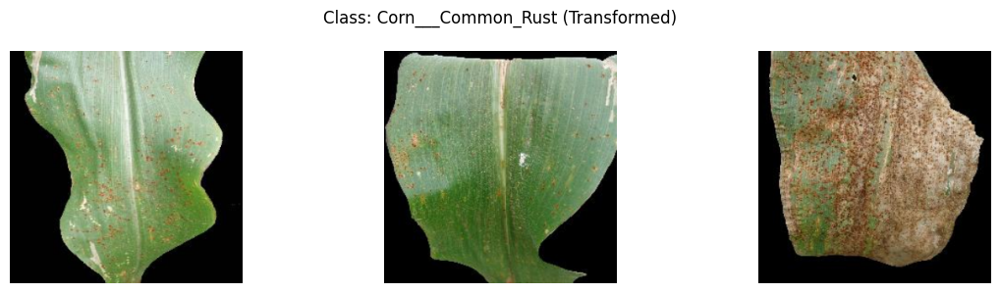

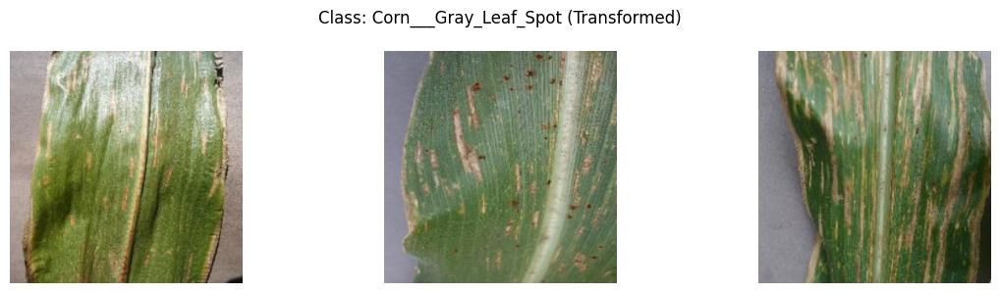

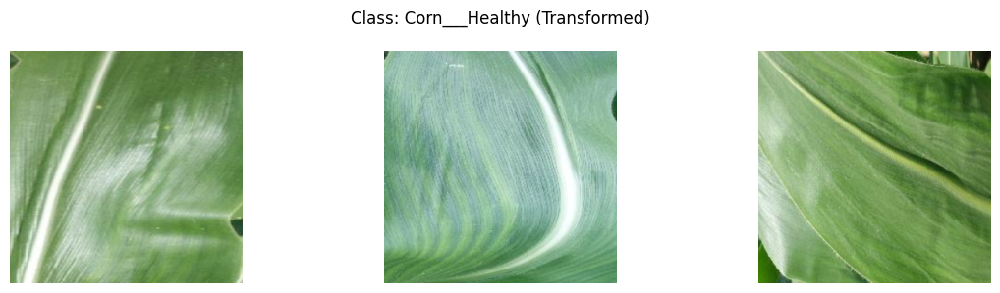

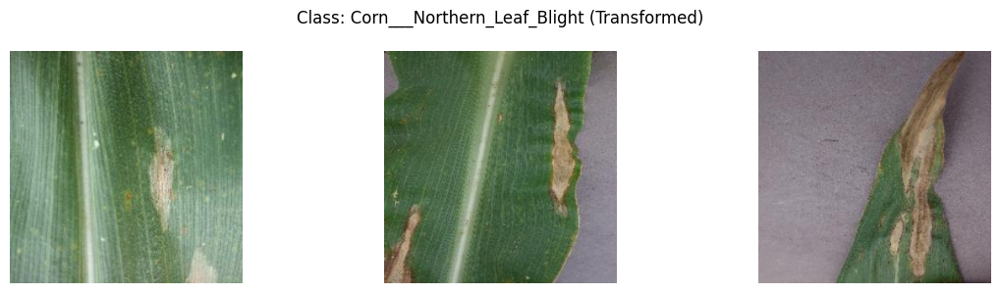

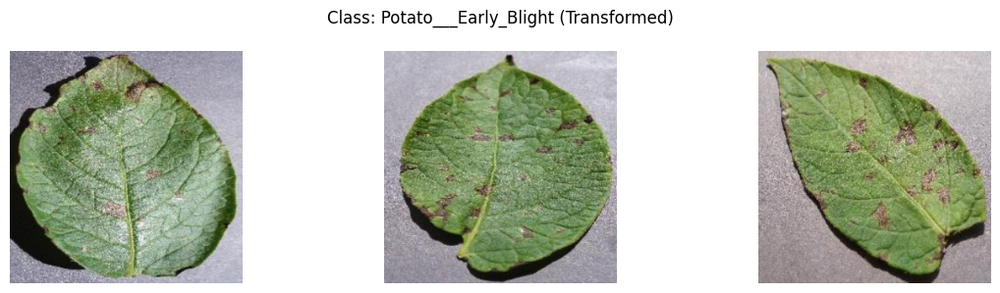

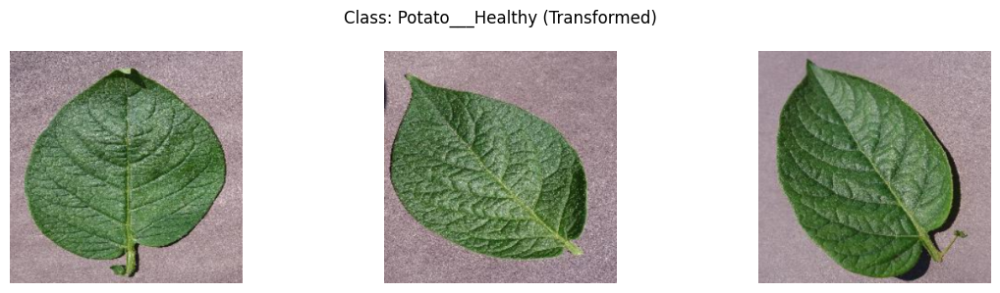

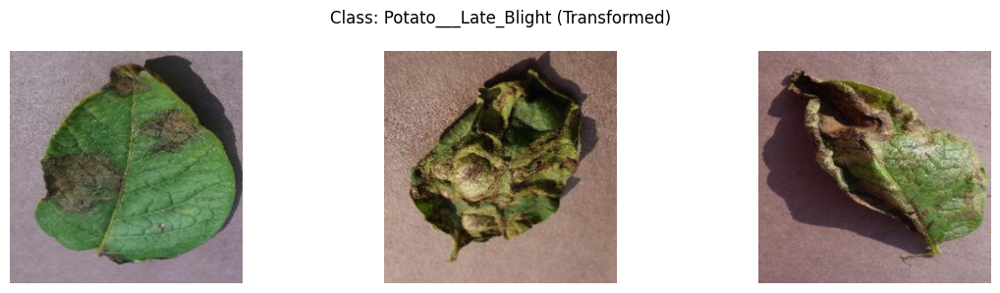

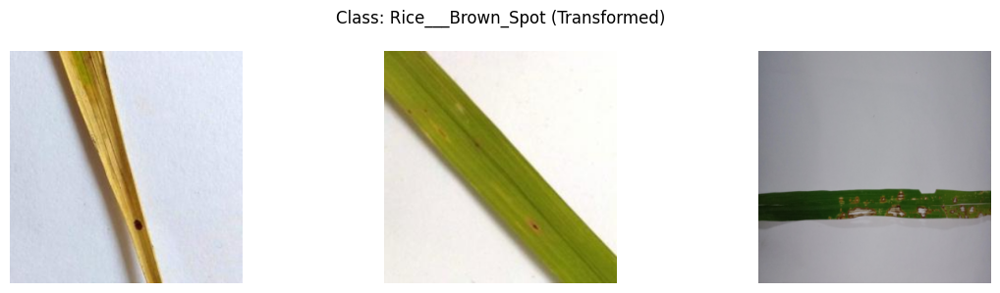

In [18]:
# Display 3 transformed images per class
for class_name in image_dataset.classes[:8]:
    class_path = os.path.join(merged_disease_path, class_name)
    image_files = os.listdir(class_path)[:3]  # First 3 images

    plt.figure(figsize=(12, 3))
    plt.suptitle(f"Class: {class_name} (Transformed)", fontsize=12)

    for i, image_file in enumerate(image_files):
        img_path = os.path.join(class_path, image_file)
        img = Image.open(img_path)

        # Transform images
        img_transformed = tranform(img)

        # Convert tensor back to PIL for display
        img_to_show = transforms.ToPILImage()(img_transformed)

        plt.subplot(1, 3, i+1)
        plt.imshow(img_to_show)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

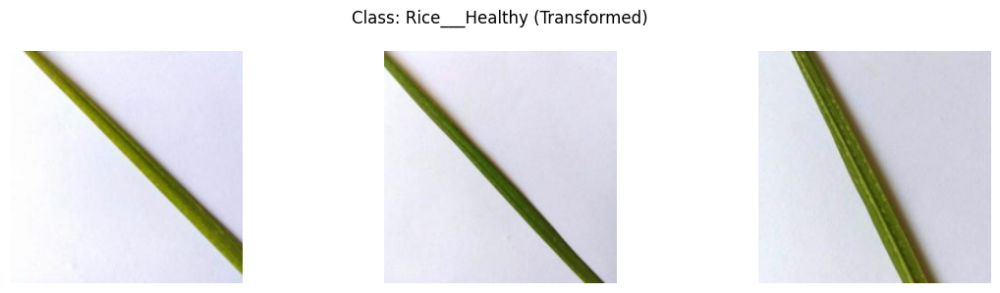

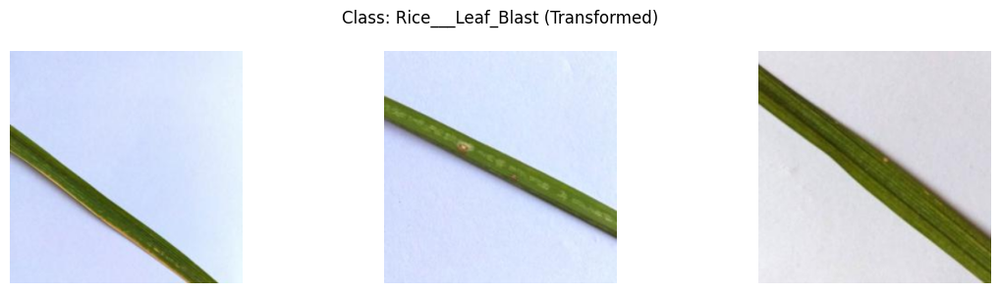

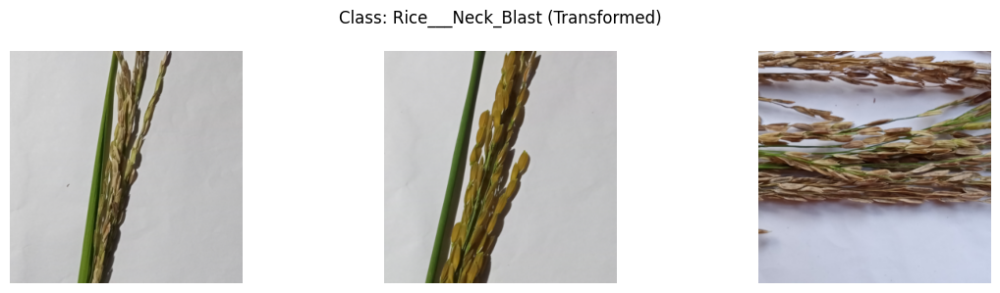

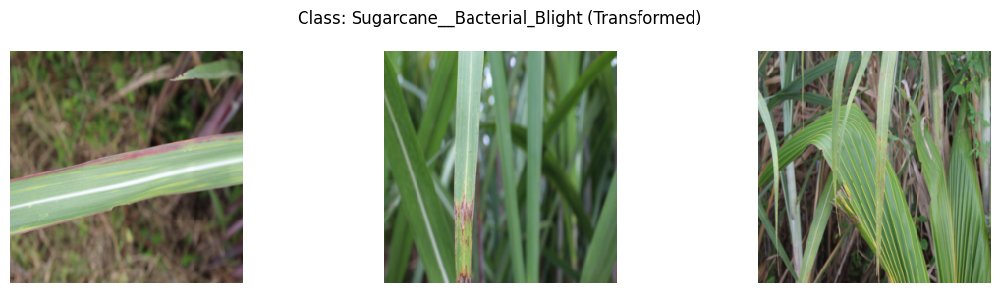

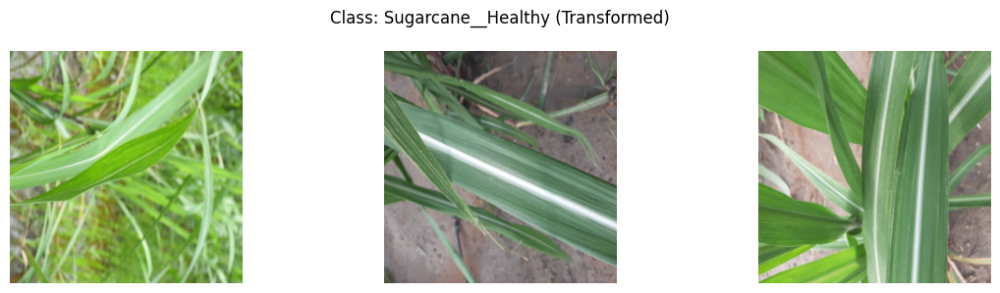

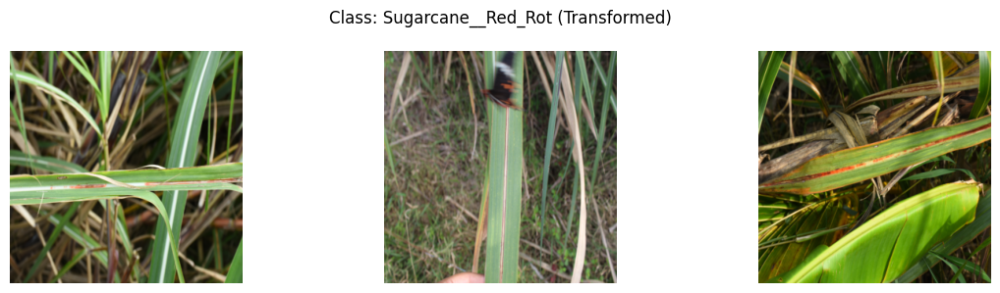

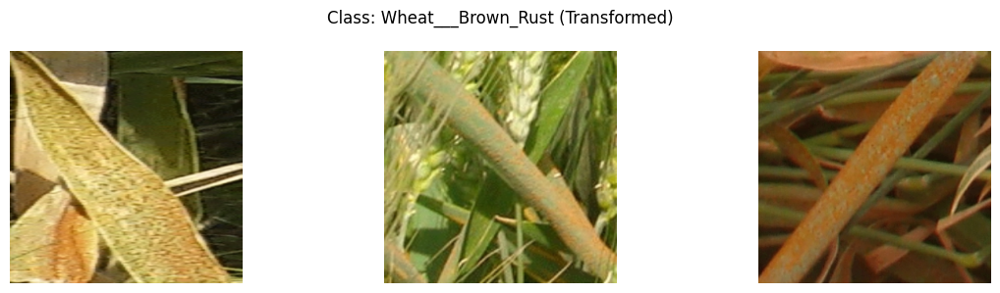

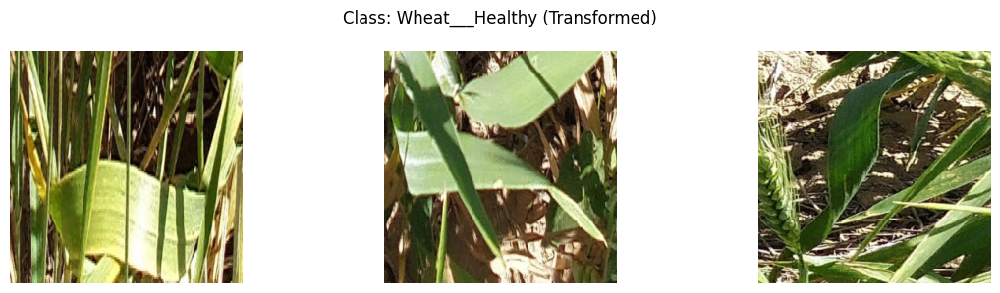

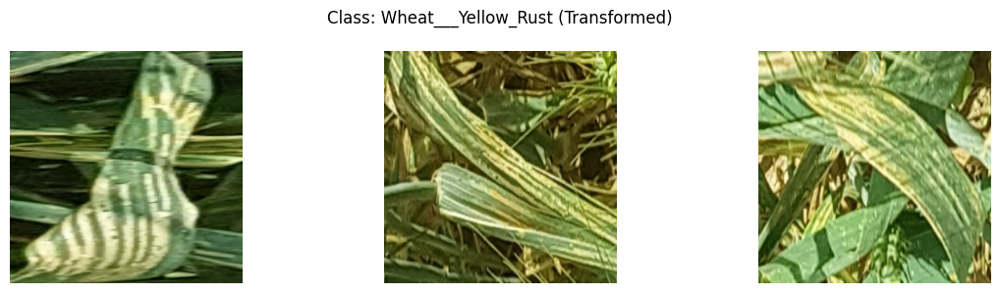

In [19]:
# Display 3 transformed images per class
for next_class_name in image_dataset.classes[8:]:
    class_path = os.path.join(merged_disease_path, next_class_name)
    image_files = os.listdir(class_path)[:3]  # First 3 images

    plt.figure(figsize=(12, 3))
    plt.suptitle(f"Class: {next_class_name} (Transformed)", fontsize=12)

    for i, image_file in enumerate(image_files):
        img_path = os.path.join(class_path, image_file)
        img = Image.open(img_path)

        # Transform images
        img_transformed = tranform(img)

        # Convert tensor back to PIL for display
        img_to_show = transforms.ToPILImage()(img_transformed)

        plt.subplot(1, 3, i+1)
        plt.imshow(img_to_show)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [66]:
# Data Splitting

train_data, val_data = random_split(image_dataset, [0.8, 0.2])

length_train = len(train_data)
length_val = len(val_data)
#length_test = len(test_data)
length_data = len(image_dataset)
training_percent = np.round(100 * length_train / length_data, 2)
val_percent = np.round(100 * length_val / length_data, 2)
#test_percent = np.round(100 * length_test / length_data, 2)

print(f"Train data is {training_percent}% of our data")
print(f"Validation data is {val_percent}% of our data")
#print(f"Test data is {test_percent}% of our data")

Train data is 80.01% of our data
Validation data is 19.99% of our data


In [67]:
# Count dataset class per split
def counts_class(data):
    c = Counter(x[1] for x in tqdm(data))
    class_to_index = data.dataset.class_to_idx
    return pd.Series({cat: c[idx] for cat, idx in class_to_index.items()})

# Calculate split distributions
training_distributions = counts_class(train_data)
val_distributions = counts_class(val_data)

  0%|          | 0/10660 [00:00<?, ?it/s]

  0%|          | 0/2664 [00:00<?, ?it/s]

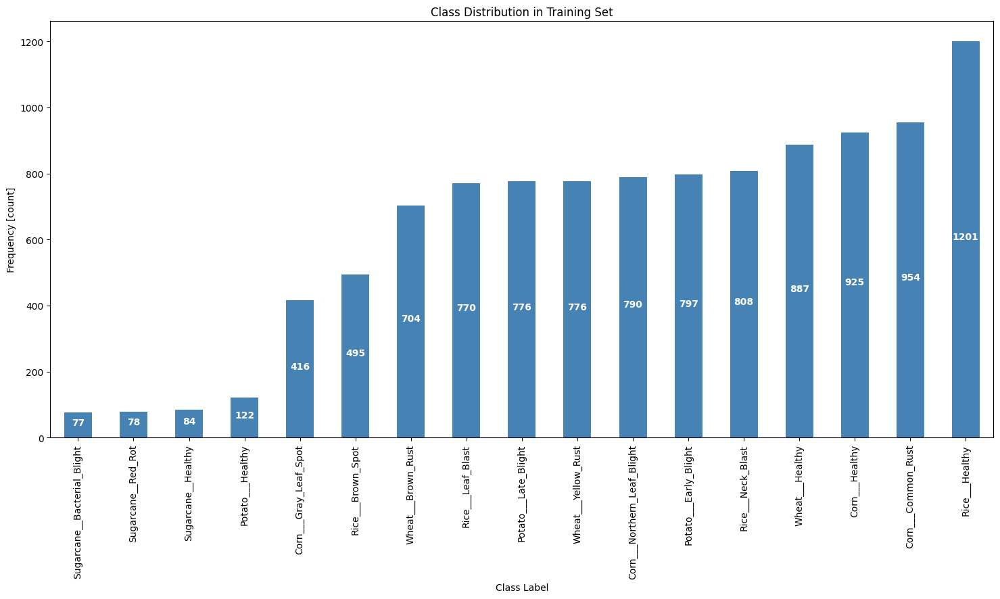

In [22]:
# Plot the training bar chart
ax = training_distributions.sort_values().plot(kind="bar", color='steelblue', figsize=(18, 8))

# Add axis labels and title
plt.xlabel("Class Label")
plt.ylabel("Frequency [count]")
plt.title("Class Distribution in Training Set")

# Overlay the value centered in each bar
for i, v in enumerate(training_distributions.sort_values()):
    bar = ax.patches[i]
    ax.text(
        bar.get_x() + bar.get_width() / 2,  # X position
        v / 2,                              # Y position
        str(v),                             # Text
        color='white', fontweight='bold', ha='center'
    )

plt.show()

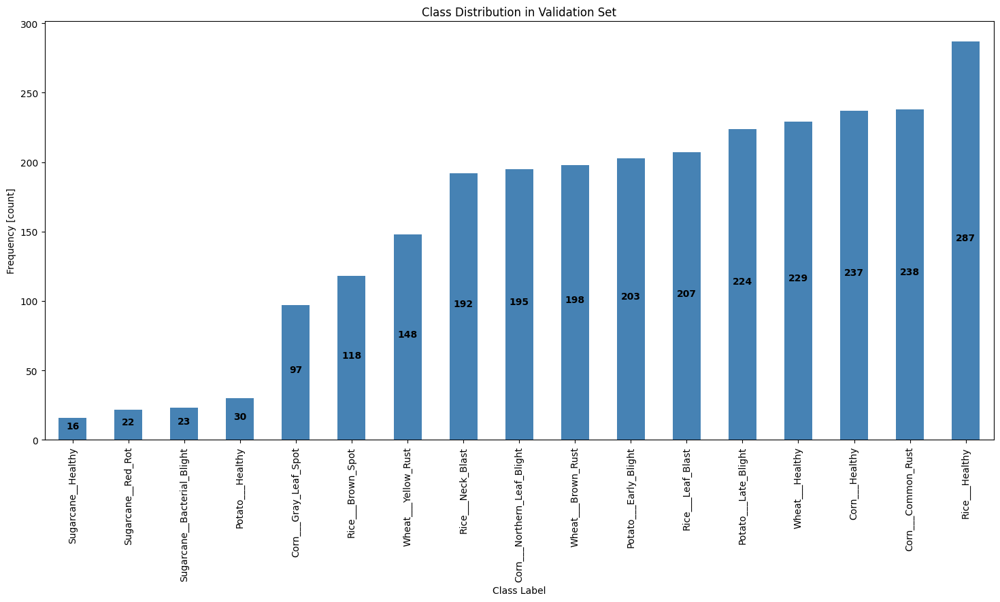

In [23]:
# Plot the validation bar chart
ax = val_distributions.sort_values().plot(kind="bar", color='steelblue', figsize=(18, 8))

# Add axis labels and title
plt.xlabel("Class Label")
plt.ylabel("Frequency [count]")
plt.title("Class Distribution in Validation Set")

# Overlay the value centered in each bar
for i, v in enumerate(val_distributions.sort_values()):
    bar = ax.patches[i]
    ax.text(
        bar.get_x() + bar.get_width() / 2,  # X position
        v / 2,                              # Y position
        str(v),                             # Text
        color='black', fontweight='bold', ha='center'
    )

plt.show()

In [68]:
# Compute Mean & STD for each color channels
def get_mean_std(loader):

    channels_sum, channels_squared_sum, num_batches = 0, 0, 0
    for data, _ in tqdm(loader, desc="Computing mean and std", leave=False):
        channels_sum += torch.mean(data, dim=[0, 2, 3])
        channels_squared_sum += torch.mean(data**2, dim=[0, 2, 3])
        num_batches += 1
    mean = channels_sum / num_batches
    std = (channels_squared_sum / num_batches - mean**2) ** 0.5

    return mean, std


mean, std = get_mean_std(dataloader)

print(f"Mean: {mean}")
print(f"Standard deviation: {std}")

Computing mean and std:   0%|          | 0/209 [00:00<?, ?it/s]

Mean: tensor([0.5495, 0.5722, 0.4754])
Standard deviation: tensor([0.2452, 0.2359, 0.2932])


In [69]:
# 300 image_size for EfficientNet-B3
eff_mean = [0.5495, 0.5722, 0.4754]
eff_std = [0.2452, 0.2359, 0.2932]

In [26]:
# Data Augmentation

# Define training augmentations
training_augmentation = transforms.Compose([
    transforms.Resize((300, 300)),#((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean= eff_mean, std= eff_std)
])

# Define tranformation for validation and testing
val_tranformation = transforms.Compose([
    transforms.Resize((300, 300)), #((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean = eff_mean, std = eff_std),
])

In [27]:
# Transform splits
train_data = datasets.ImageFolder(root = merged_disease_path, transform = training_augmentation)
val_data = datasets.ImageFolder(root = merged_disease_path, transform = val_tranformation)

In [28]:
# create DataLoader for splits

batch_size = 64

training_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True, num_workers=2)
valid_loader = DataLoader(val_data, batch_size = batch_size, shuffle = False, num_workers=2)

single_batch = next(iter(training_loader))[0]
single_shape = single_batch.shape
print(f"Shape of one batch: {single_shape}")

Shape of one batch: torch.Size([64, 3, 300, 300])


In [29]:
# create DataLoader for splits

batch_size = 64

training_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True, num_workers=2)
valid_loader = DataLoader(val_data, batch_size = batch_size, shuffle = False, num_workers=2)

single_batch = next(iter(training_loader))[0]
single_shape = single_batch.shape
print(f"Shape of one batch: {single_shape}")

Shape of one batch: torch.Size([64, 3, 300, 300])


In [70]:
# Load EfficientNet-B3 with pretrained ImageNet weights
eff_model = timm.create_model('efficientnet_b3', pretrained=True)

In [31]:
# Freeze the base layers (optional if you want only fine-tuning)
for param in eff_model.parameters():
    param.requires_grad = False

In [32]:
# Create the model summary
summary(eff_model, input_size = single_shape)

Layer (type:depth-idx)                        Output Shape              Param #
EfficientNet                                  [64, 1000]                --
├─Conv2d: 1-1                                 [64, 40, 150, 150]        (1,080)
├─BatchNormAct2d: 1-2                         [64, 40, 150, 150]        80
│    └─Identity: 2-1                          [64, 40, 150, 150]        --
│    └─SiLU: 2-2                              [64, 40, 150, 150]        --
├─Sequential: 1-3                             [64, 384, 10, 10]         --
│    └─Sequential: 2-3                        [64, 24, 150, 150]        --
│    │    └─DepthwiseSeparableConv: 3-1       [64, 24, 150, 150]        (2,298)
│    │    └─DepthwiseSeparableConv: 3-2       [64, 24, 150, 150]        (1,206)
│    └─Sequential: 2-4                        [64, 32, 75, 75]          --
│    │    └─InvertedResidual: 3-3             [64, 32, 75, 75]          (11,878)
│    │    └─InvertedResidual: 3-4             [64, 32, 75, 75]          (1

In [33]:
# Move the model to device
eff_model.to(device)

# Move our single_batch to device
single_batch_cuda = single_batch.to(device)

print("Single Test batch is running on:", single_batch_cuda.device)

Single Test batch is running on: cuda:0


In [34]:
# Test the model on single test batch
eff_model_test = eff_model(single_batch_cuda)
eff_model_test_shape = eff_model_test.shape

print("Output shape:", eff_model_test_shape)

Output shape: torch.Size([64, 1000])


In [35]:
# Get the classifier layer
list(eff_model.named_modules())[-1]

('classifier', Linear(in_features=1536, out_features=1000, bias=True))

In [37]:
# get info about efficient classifier layer
eff_model.classifier

Linear(in_features=1536, out_features=1000, bias=True)

In [38]:
# Save number of input features to variable
in_features = eff_model.classifier.in_features
in_features

1536

In [39]:
# get the number of classes in our dataset
num_classes = len(train_data.classes)
num_classes

17

In [40]:
# Build our new layer
new_classifier = torch.nn.Sequential()
output_layer = torch.nn.Linear(in_features = in_features, out_features = num_classes)

# Add new layer to our new classifier
new_classifier.append(output_layer)

Sequential(
  (0): Linear(in_features=1536, out_features=17, bias=True)
)

In [41]:
# Replace the classifier layer
eff_model.classifier = new_classifier

# Create the model summary
summary(eff_model, input_size = single_shape)

Layer (type:depth-idx)                        Output Shape              Param #
EfficientNet                                  [64, 17]                  --
├─Conv2d: 1-1                                 [64, 40, 150, 150]        (1,080)
├─BatchNormAct2d: 1-2                         [64, 40, 150, 150]        80
│    └─Identity: 2-1                          [64, 40, 150, 150]        --
│    └─SiLU: 2-2                              [64, 40, 150, 150]        --
├─Sequential: 1-3                             [64, 384, 10, 10]         --
│    └─Sequential: 2-3                        [64, 24, 150, 150]        --
│    │    └─DepthwiseSeparableConv: 3-1       [64, 24, 150, 150]        (2,298)
│    │    └─DepthwiseSeparableConv: 3-2       [64, 24, 150, 150]        (1,206)
│    └─Sequential: 2-4                        [64, 32, 75, 75]          --
│    │    └─InvertedResidual: 3-3             [64, 32, 75, 75]          (11,878)
│    │    └─InvertedResidual: 3-4             [64, 32, 75, 75]          (1

In [42]:
# Cross validation
kfold_splitter = sklearn.model_selection.KFold(n_splits = 5, shuffle=True, random_state=42)

nums_train, nums_val = next(kfold_splitter.split(range(100)))
fraction_fold = len(nums_val) / (len(nums_train) + len(nums_val))
print(f"One fold is {100 * fraction_fold:.2f}% of our training set")

One fold is 20.00% of our training set


In [43]:
# Define LossFunction and Optimizer
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = optim.Adam(eff_model.parameters())

In [44]:
# Create a directory for saving models if it doesn't exist
save_dir = "/kaggle/working/"
#"/content/drive/My Drive/AI for Smart Urban Farming/diseases_detection_model_checkpoints"
#os.makedirs(save_dir, exist_ok=True)

print(f"Models will be saved to {save_dir}")

Models will be saved to /kaggle/working/


In [45]:
# Training parameters
num_epochs = 50
patience = 3
best_val_loss = float('inf')
early_stop_counter = 0

# GradScaler initialization
scaler = torch.amp.GradScaler("cuda")  # For mixed precision

# Define save directory (inside Kaggle output directory)
save_dir = "/kaggle/working/model_checkpoints"  # Create a folder for model checkpoints

# Ensure the save directory exists
os.makedirs(save_dir, exist_ok=True)

# Wrap the epoch loop with tqdm for a progress bar
for epoch in tqdm(range(num_epochs), desc="Training", unit="epoch"):
    eff_model.train()
    running_loss = 0.0

    # Wrap training_loader with tqdm for batch-level progress
    train_loop = tqdm(training_loader, leave=False, desc=f"Epoch {epoch+1}/{num_epochs}")
    for inputs, labels in train_loop:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()

        with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
            outputs = eff_model(inputs)
            loss = loss_fn(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()

        # Update progress bar description with current loss
        train_loop.set_postfix(train_loss=f"{loss.item():.4f}")

    train_loss = running_loss / len(training_loader)

    # Validation loop (optional: add tqdm here too)
    eff_model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
                outputs = eff_model(inputs)
                loss = loss_fn(outputs, labels)

            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss /= len(valid_loader)
    val_acc = 100 * correct / total

    # Print epoch stats (now shown in tqdm bar)
    tqdm.write(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")

    # Early stopping logic
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stop_counter = 0
        torch.save(eff_model.state_dict(), os.path.join(save_dir, 'best_model.pt'))  # Save the best model
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            tqdm.write(f"Early stopping at epoch {epoch+1}")
            break

    # Save checkpoint every 5 epochs
    if (epoch + 1) % 5 == 0:
        checkpoint_path = os.path.join(save_dir, f'model_epoch_{epoch+1}.pt')
        torch.save(eff_model.state_dict(), checkpoint_path)
        tqdm.write(f"Saved checkpoint to {checkpoint_path}")

print("Training complete.")

Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

Epoch 1/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.7208 | Val Loss: 0.3371 | Val Acc: 90.85%


Epoch 2/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 2/50 | Train Loss: 0.2994 | Val Loss: 0.2622 | Val Acc: 91.44%


Epoch 3/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 3/50 | Train Loss: 0.2528 | Val Loss: 0.2242 | Val Acc: 92.58%


Epoch 4/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 4/50 | Train Loss: 0.2259 | Val Loss: 0.2048 | Val Acc: 93.13%


Epoch 5/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 5/50 | Train Loss: 0.2101 | Val Loss: 0.1962 | Val Acc: 93.03%
Saved checkpoint to /kaggle/working/model_checkpoints/model_epoch_5.pt


Epoch 6/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 6/50 | Train Loss: 0.2027 | Val Loss: 0.1868 | Val Acc: 93.38%


Epoch 7/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 7/50 | Train Loss: 0.1930 | Val Loss: 0.1755 | Val Acc: 93.82%


Epoch 8/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 8/50 | Train Loss: 0.1834 | Val Loss: 0.1713 | Val Acc: 93.81%


Epoch 9/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 9/50 | Train Loss: 0.1839 | Val Loss: 0.1716 | Val Acc: 93.97%


Epoch 10/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 10/50 | Train Loss: 0.1776 | Val Loss: 0.1640 | Val Acc: 94.06%
Saved checkpoint to /kaggle/working/model_checkpoints/model_epoch_10.pt


Epoch 11/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 11/50 | Train Loss: 0.1701 | Val Loss: 0.1570 | Val Acc: 94.45%


Epoch 12/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 12/50 | Train Loss: 0.1730 | Val Loss: 0.1538 | Val Acc: 94.63%


Epoch 13/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 13/50 | Train Loss: 0.1682 | Val Loss: 0.1521 | Val Acc: 94.60%


Epoch 14/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 14/50 | Train Loss: 0.1666 | Val Loss: 0.1521 | Val Acc: 94.51%


Epoch 15/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 15/50 | Train Loss: 0.1621 | Val Loss: 0.1550 | Val Acc: 94.27%
Saved checkpoint to /kaggle/working/model_checkpoints/model_epoch_15.pt


Epoch 16/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 16/50 | Train Loss: 0.1589 | Val Loss: 0.1474 | Val Acc: 94.72%


Epoch 17/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 17/50 | Train Loss: 0.1514 | Val Loss: 0.1467 | Val Acc: 94.68%


Epoch 18/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 18/50 | Train Loss: 0.1531 | Val Loss: 0.1446 | Val Acc: 94.72%


Epoch 19/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 19/50 | Train Loss: 0.1513 | Val Loss: 0.1472 | Val Acc: 94.58%


Epoch 20/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 20/50 | Train Loss: 0.1555 | Val Loss: 0.1430 | Val Acc: 94.72%
Saved checkpoint to /kaggle/working/model_checkpoints/model_epoch_20.pt


Epoch 21/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 21/50 | Train Loss: 0.1541 | Val Loss: 0.1414 | Val Acc: 94.85%


Epoch 22/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 22/50 | Train Loss: 0.1480 | Val Loss: 0.1358 | Val Acc: 95.13%


Epoch 23/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 23/50 | Train Loss: 0.1455 | Val Loss: 0.1377 | Val Acc: 95.10%


Epoch 24/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 24/50 | Train Loss: 0.1463 | Val Loss: 0.1341 | Val Acc: 95.03%


Epoch 25/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 25/50 | Train Loss: 0.1436 | Val Loss: 0.1354 | Val Acc: 95.01%
Saved checkpoint to /kaggle/working/model_checkpoints/model_epoch_25.pt


Epoch 26/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 26/50 | Train Loss: 0.1450 | Val Loss: 0.1336 | Val Acc: 95.20%


Epoch 27/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 27/50 | Train Loss: 0.1436 | Val Loss: 0.1357 | Val Acc: 95.08%


Epoch 28/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 28/50 | Train Loss: 0.1431 | Val Loss: 0.1363 | Val Acc: 94.98%


Epoch 29/50:   0%|          | 0/209 [00:00<?, ?it/s]

Epoch 29/50 | Train Loss: 0.1424 | Val Loss: 0.1376 | Val Acc: 94.80%
Early stopping at epoch 29
Training complete.


In [47]:
# Send model to device
model = eff_model.to(device)

# Initialize lists for predictions and labels
all_preds = []
all_labels = []

# Loop through the test/validation loader
with torch.no_grad():
    for images, labels in valid_loader:  # Replace with your DataLoader
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

In [54]:
# Calculate Metrics
acc = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='macro')
recall = recall_score(all_labels, all_preds, average='macro')
f1 = f1_score(all_labels, all_preds, average='macro')

# Generate the classification report as a dictionary
report_dict = classification_report(all_labels, all_preds, target_names=image_dataset.classes, output_dict=True)

# Print Metrics
print("Evaluation Metrics")
print(f"Accuracy:  {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")

# You can now print the classification report as a dictionary or convert it to a DataFrame for better viewing
import pandas as pd
classification_df = pd.DataFrame(report_dict).transpose()

# Print the DataFrame for better viewing
print("\nClassification Report:\n")
classification_df

Evaluation Metrics
Accuracy:  0.9476
Precision: 0.9539
Recall:    0.9446
F1 Score:  0.9480

Classification Report:



,precision,recall,f1-score,support
Corn___Common_Rust,1.000000,1.000000,1.000000,1192.000000
Corn___Gray_Leaf_Spot,0.976303,0.803119,0.881283,513.000000
Corn___Healthy,1.000000,0.998279,0.999139,1162.000000
Corn___Northern_Leaf_Blight,0.904453,0.989848,0.945225,985.000000
Potato___Early_Blight,0.999000,0.999000,0.999000,1000.000000
Potato___Healthy,0.993421,0.993421,0.993421,152.000000
Potato___Late_Blight,0.998000,0.998000,0.998000,1000.000000
Rice___Brown_Spot,0.814889,0.660685,0.729730,613.000000
Rice___Healthy,0.839165,0.918683,0.877125,1488.000000
Rice___Leaf_Blast,0.772871,0.752303,0.762448,977.000000


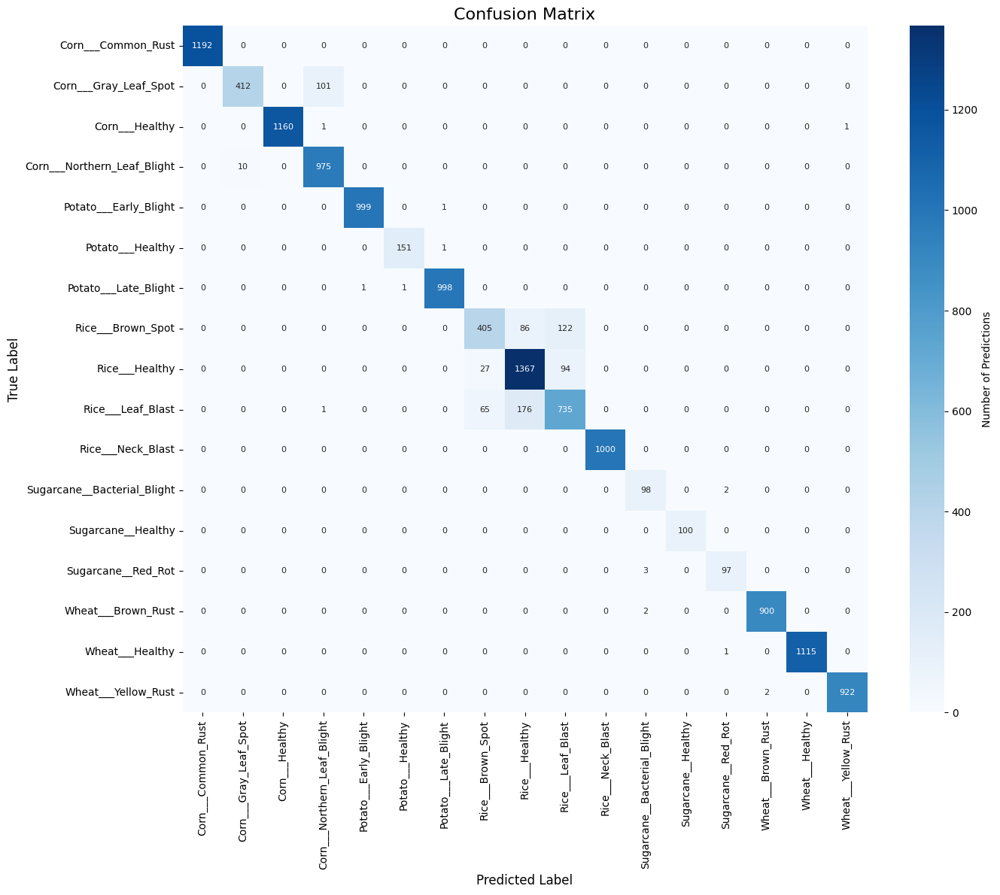

In [55]:
# Compute confusion matrix
conf_mat = confusion_matrix(all_labels, all_preds)

# Plot the confusion matrix
plt.figure(figsize=(14, 12))  # Adjust the figure size for better readability
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues',
            xticklabels=image_dataset.classes,
            yticklabels=image_dataset.classes,
            cbar_kws={'label': 'Number of Predictions'},
            annot_kws={"size": 8})  # Optionally reduce the font size for annotations

# Rotate the labels on the axes for better readability
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Titles and labels
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)

# Layout adjustment to avoid clipping
plt.tight_layout()

# Show the plot
plt.show()